# Store Sales - Time Series Forecasting

## Import libraries

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import LinearRegression
from scipy.signal import periodogram

## Load and inspect dataset

### Load the dataset from the CSV file and parse the `date` column as datetime

In [38]:
df = pd.read_csv('data.csv', parse_dates=['date'])
df

,store_nbr,family,date,sales
0,1,AUTOMOTIVE,2013-01-01,0.000000
1,1,AUTOMOTIVE,2013-01-02,2.000000
2,1,AUTOMOTIVE,2013-01-03,3.000000
3,1,AUTOMOTIVE,2013-01-04,3.000000
4,1,AUTOMOTIVE,2013-01-05,5.000000
...,...,...,...,...
3000883,9,SEAFOOD,2017-08-11,23.831000
3000884,9,SEAFOOD,2017-08-12,16.859001
3000885,9,SEAFOOD,2017-08-13,20.000000
3000886,9,SEAFOOD,2017-08-14,17.000000


### Get information about the columns

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   store_nbr  int64         
 1   family     object        
 2   date       datetime64[ns]
 3   sales      float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 91.6+ MB


In [40]:
df.describe()

,store_nbr,date,sales
count,3.000888e+06,3000888,3.000888e+06
mean,2.750000e+01,2015-04-24 08:27:04.703088640,3.577757e+02
min,1.000000e+00,2013-01-01 00:00:00,0.000000e+00
25%,1.400000e+01,2014-02-26 18:00:00,0.000000e+00
50%,2.750000e+01,2015-04-24 12:00:00,1.100000e+01
75%,4.100000e+01,2016-06-19 06:00:00,1.958473e+02
max,5.400000e+01,2017-08-15 00:00:00,1.247170e+05
std,1.558579e+01,NaN,1.101998e+03


In [41]:
df['family'].unique()

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

## Remove NaN values

In [42]:
df.dropna(inplace=True)
df

,store_nbr,family,date,sales
0,1,AUTOMOTIVE,2013-01-01,0.000000
1,1,AUTOMOTIVE,2013-01-02,2.000000
2,1,AUTOMOTIVE,2013-01-03,3.000000
3,1,AUTOMOTIVE,2013-01-04,3.000000
4,1,AUTOMOTIVE,2013-01-05,5.000000
...,...,...,...,...
3000883,9,SEAFOOD,2017-08-11,23.831000
3000884,9,SEAFOOD,2017-08-12,16.859001
3000885,9,SEAFOOD,2017-08-13,20.000000
3000886,9,SEAFOOD,2017-08-14,17.000000


## Group dataset by product family

In [43]:
grouped_df = df.groupby('family')
grouped_df

## Exploratory Data Analysis (EDA)

/var/folders/g0/db_6133s4c72c83lmc3808m40000gn/T/ipykernel_31561/2991649242.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(4, 1, figsize=(15, 15))


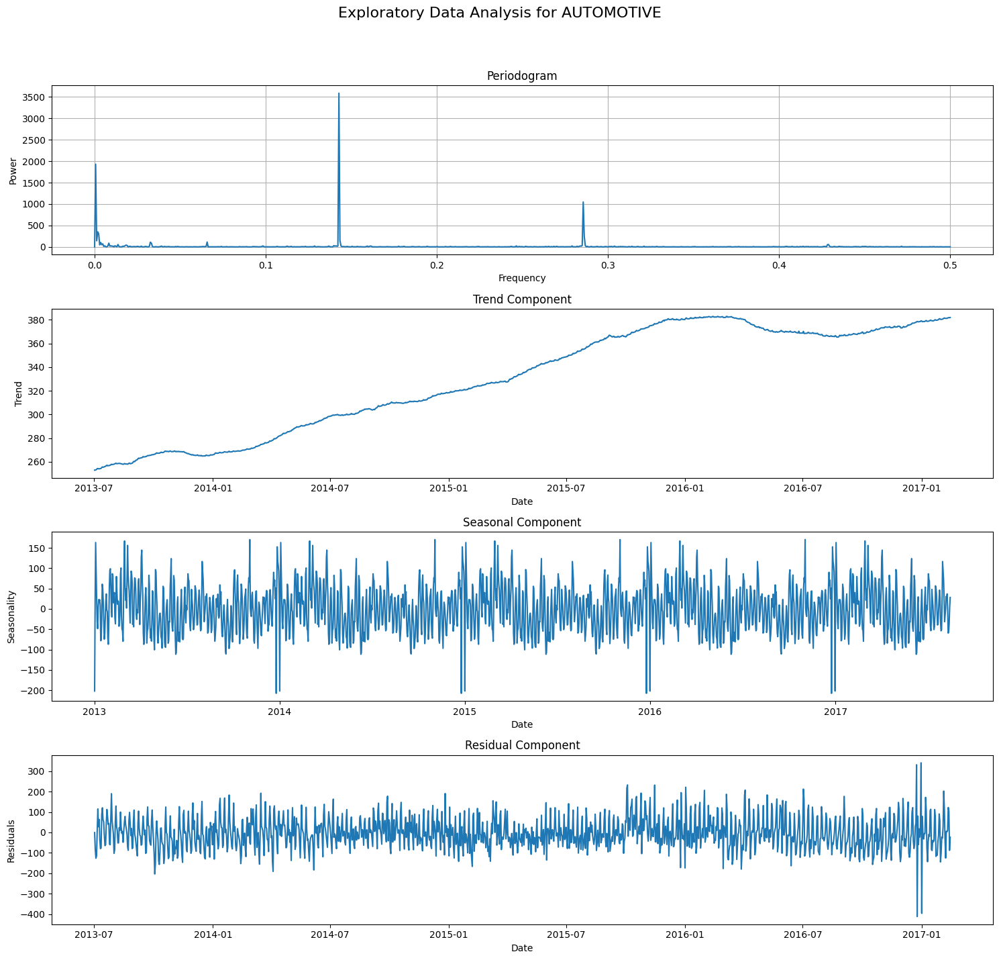

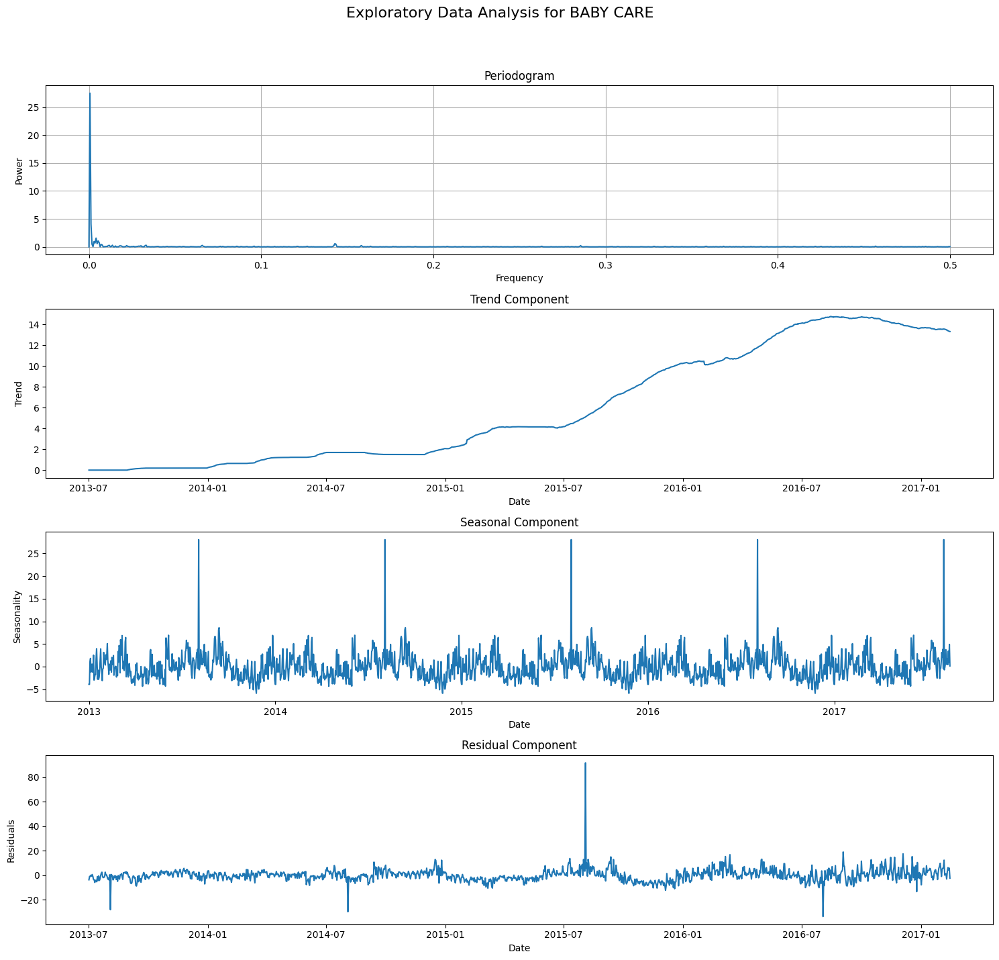

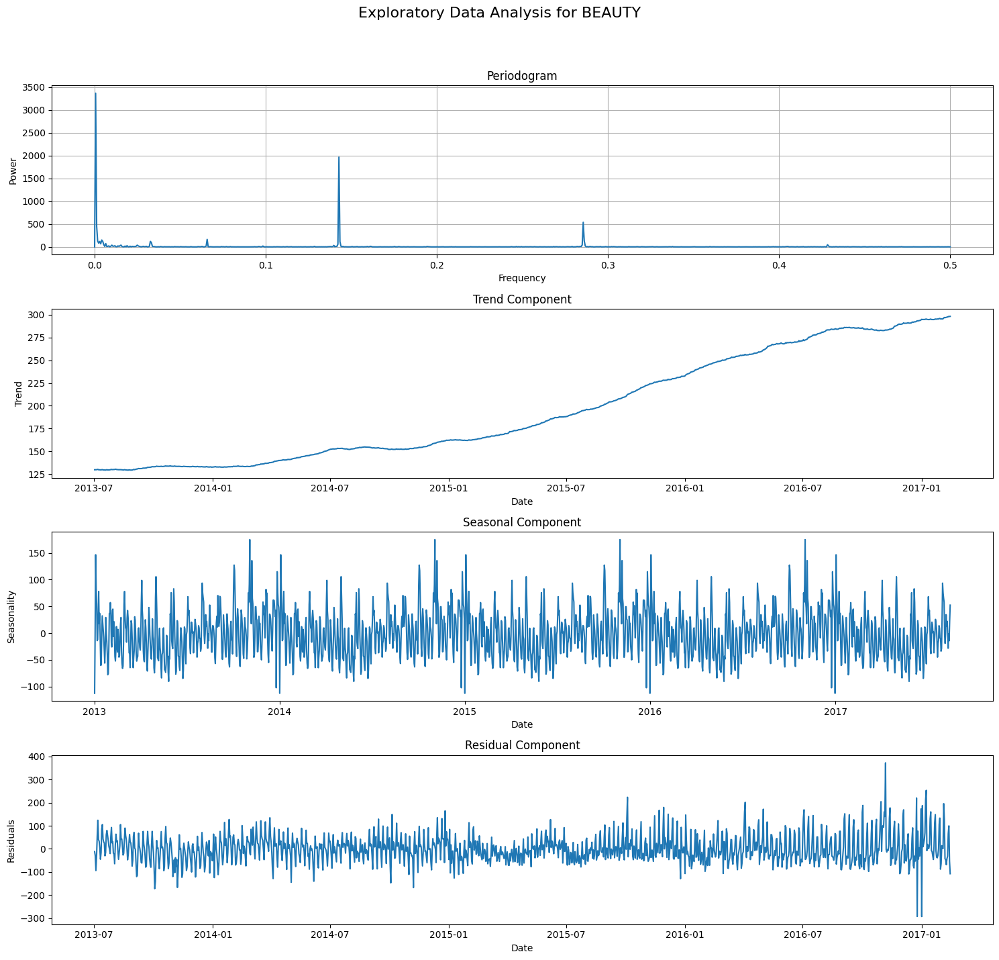

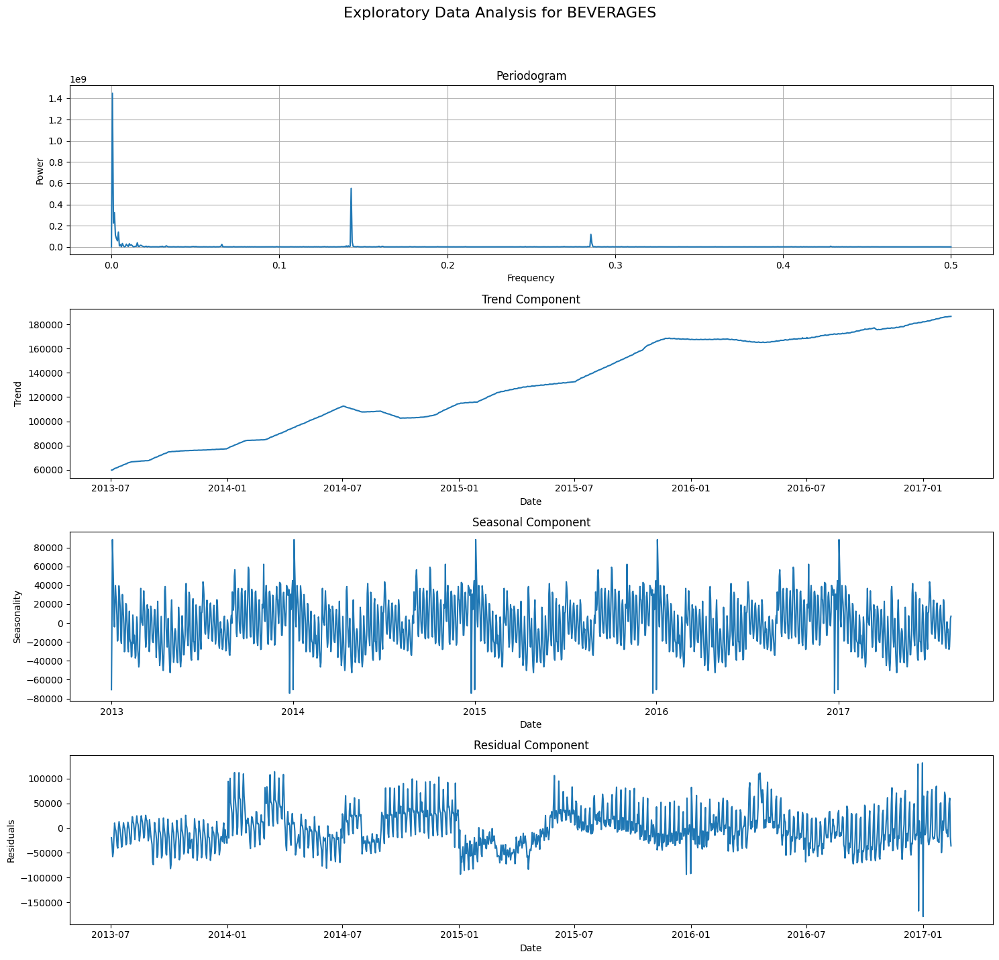

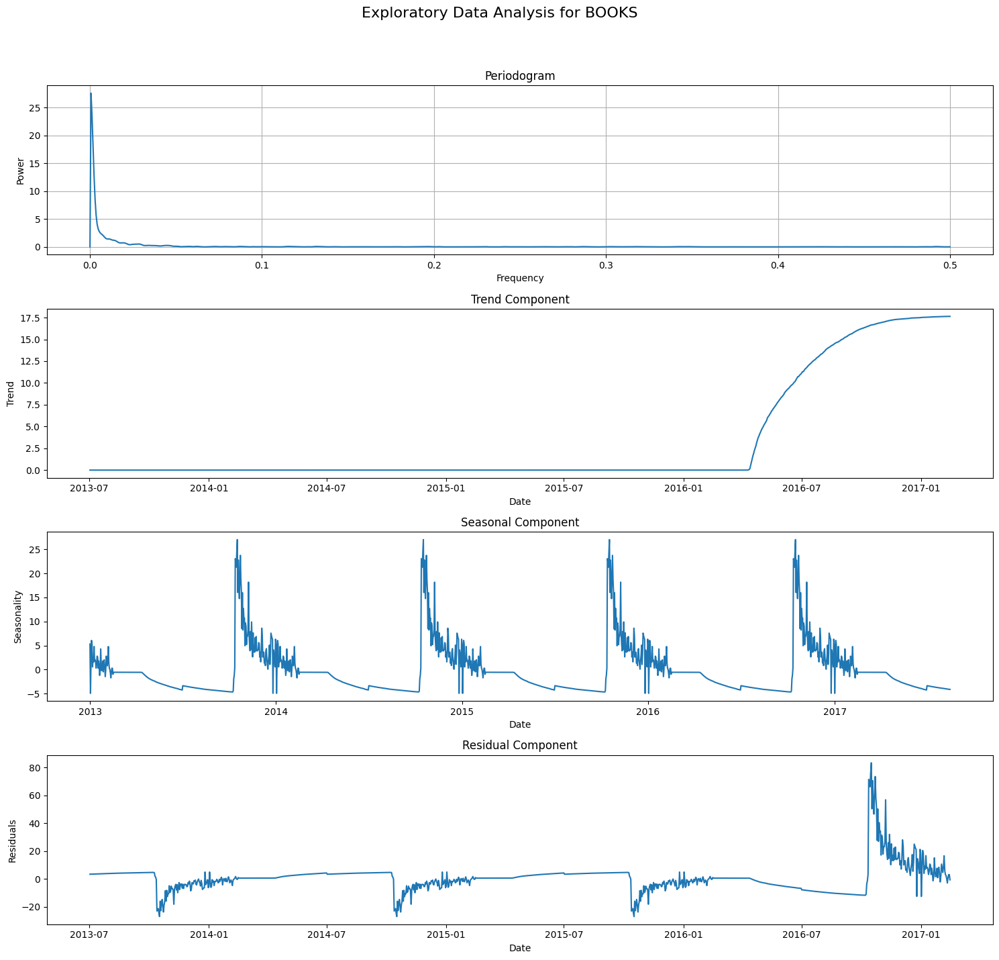

...

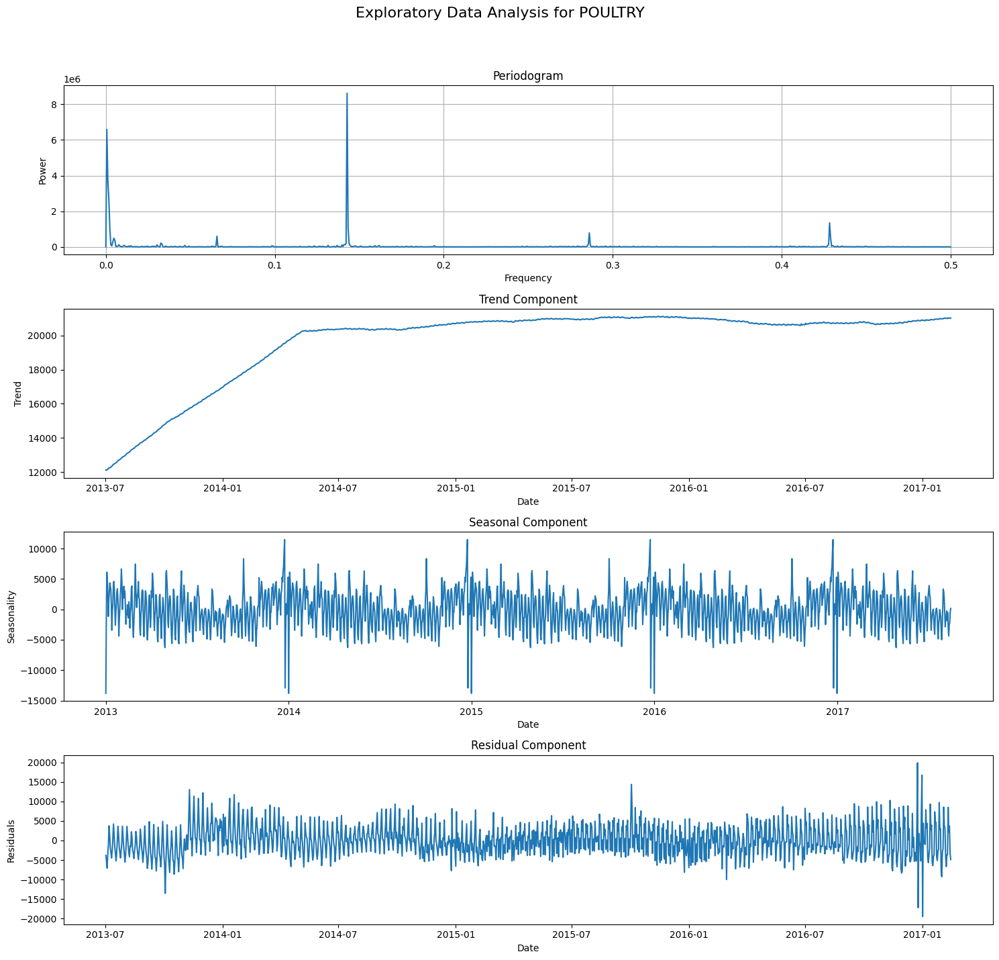

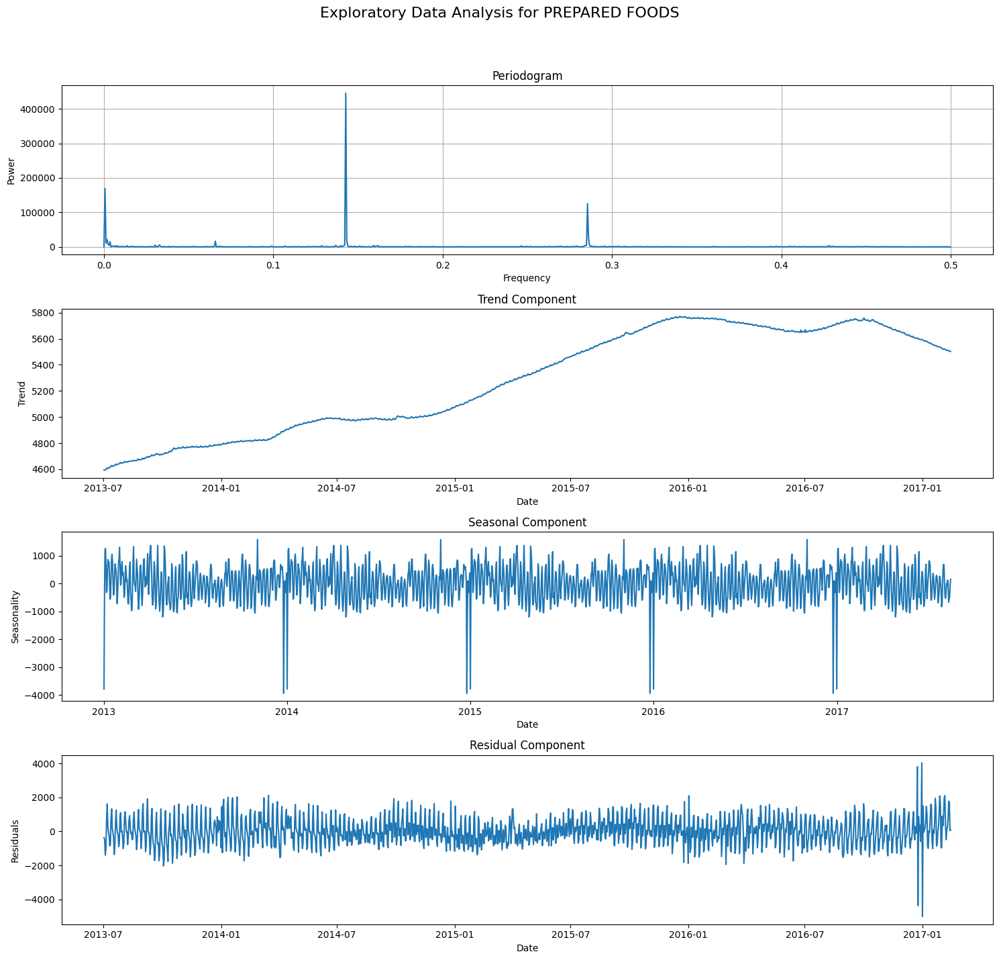

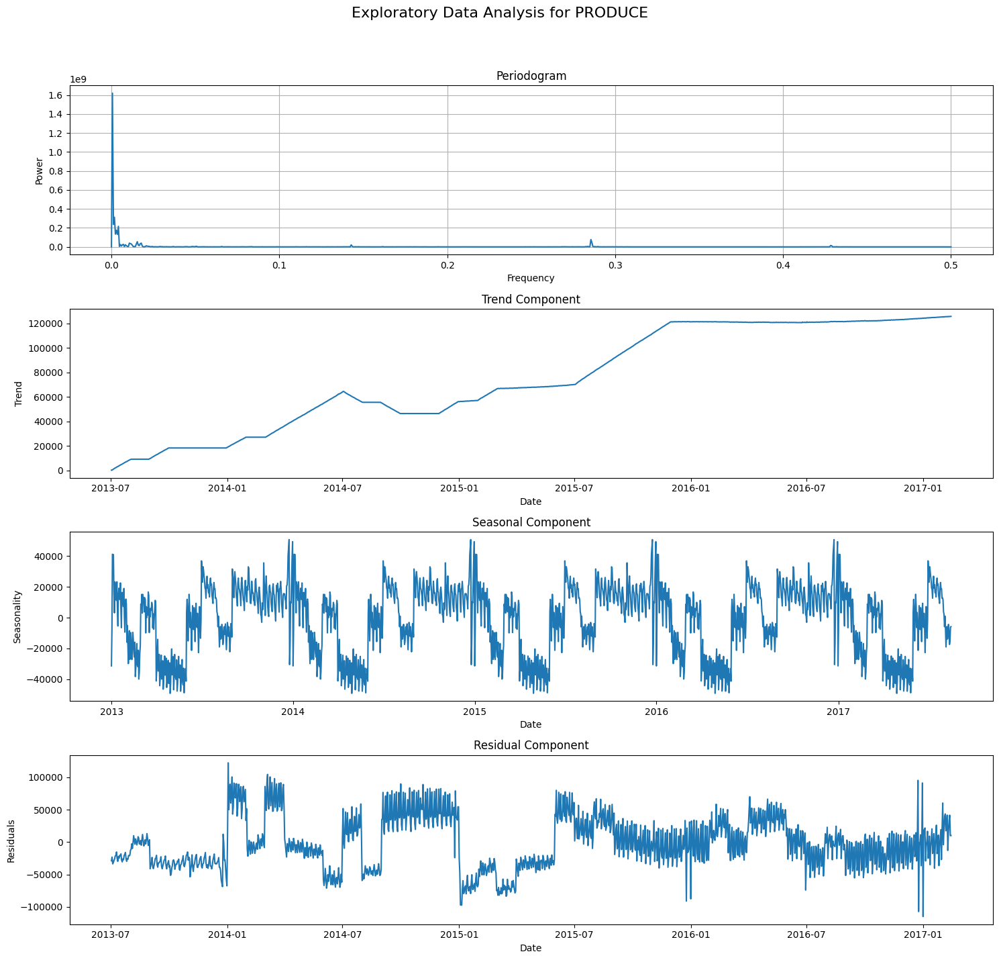

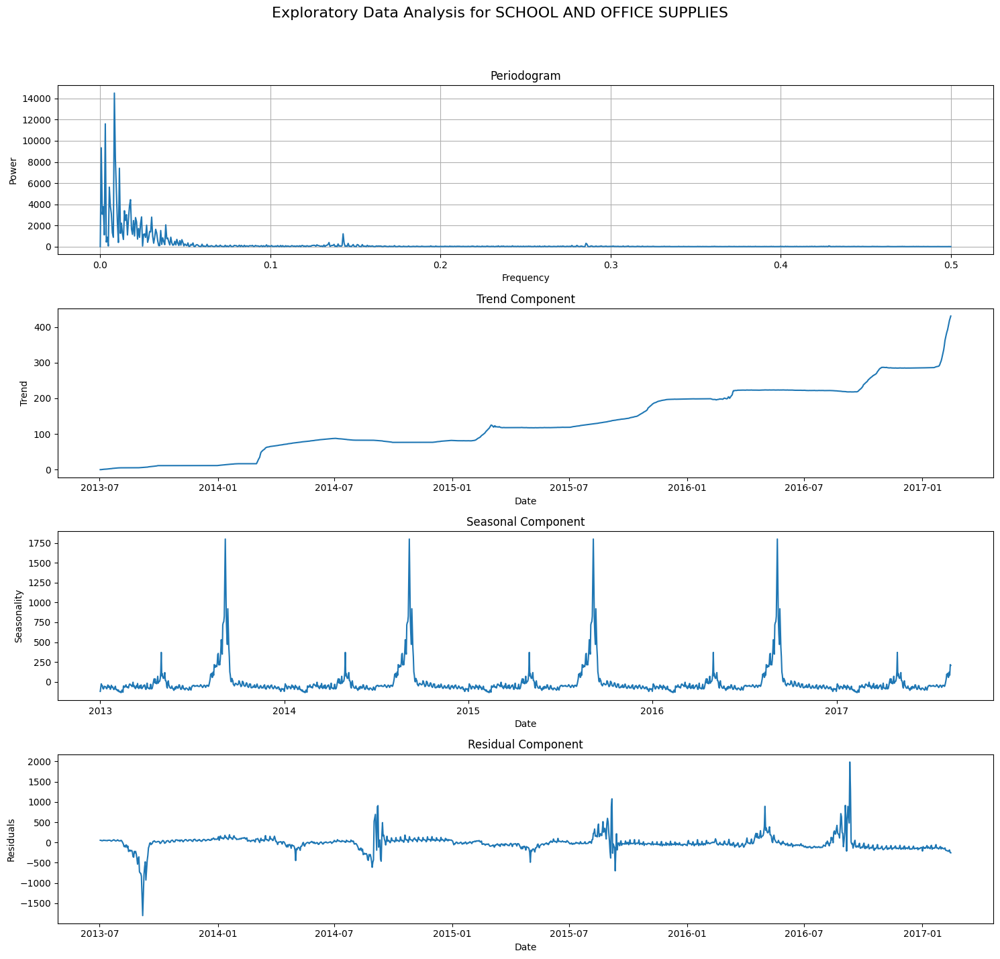

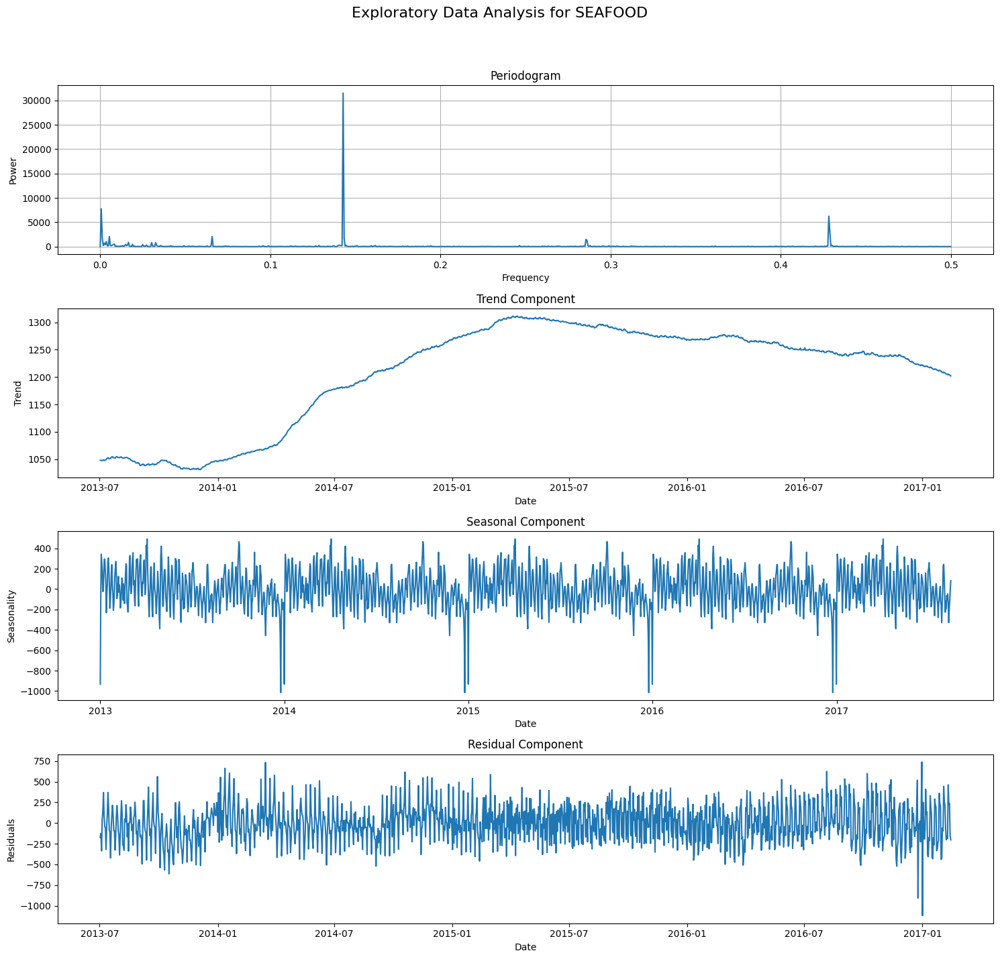

In [44]:
for family, group in grouped_df:
  # Set the date as the index
  group.set_index('date', inplace=True)
  # Handle duplicates by summing sales for duplicate dates
  group = group.groupby(group.index).sum()
  # Ensure the index has a daily frequency
  group = group.asfreq('D').fillna(0)

  # Calculate average daily sales
  avg_daily_sales = group['sales'].resample('D').mean()

  # Set up the figure and axes for plotting
  fig, axes = plt.subplots(4, 1, figsize=(15, 15))
  fig.suptitle(f'Exploratory Data Analysis for {family}', fontsize=16)

  # Plot periodogram
  freqs, power = periodogram(avg_daily_sales, scaling='spectrum')
  axes[0].plot(freqs, power)
  axes[0].set_title('Periodogram')
  axes[0].set_xlabel('Frequency')
  axes[0].set_ylabel('Power')
  axes[0].grid()

  # Decompose the time series into trend, seasonal, and residual components
  decomposition = seasonal_decompose(avg_daily_sales, model='additive', period=365)

  # Plot the trend component
  axes[1].plot(decomposition.trend)
  axes[1].set_title('Trend Component')
  axes[1].set_xlabel('Date')
  axes[1].set_ylabel('Trend')

  # Plot the seasonal component
  axes[2].plot(decomposition.seasonal)
  axes[2].set_title('Seasonal Component')
  axes[2].set_xlabel('Date')
  axes[2].set_ylabel('Seasonality')

  # Plot the residual component
  axes[3].plot(decomposition.resid)
  axes[3].set_title('Residual Component')
  axes[3].set_xlabel('Date')
  axes[3].set_ylabel('Residuals')

  plt.tight_layout(rect=[0, 0.03, 1, 0.95])

## Plot and model sales data for each product family

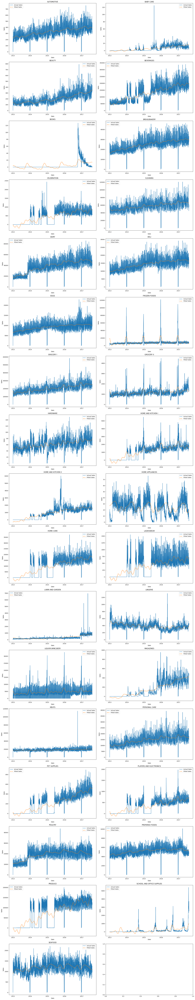

In [49]:
figure, axes = plt.subplots((len(grouped_df) + 1) // 2, 2, figsize=(20, (len(grouped_df) + 1) * 3))

index = 0
for family, group in grouped_df:
  # Set the date as the index
  group.set_index('date', inplace=True)
  # Handle duplicates by summing sales for duplicate dates
  group = group.groupby(group.index).sum()
  # Ensure the index has a daily frequency
  group = group.asfreq('D').fillna(0)

  # Define Fourier terms for capturing seasonality. YE for yearly seasonality
  fourier = CalendarFourier(freq='YE', order=4)
  # Define the deterministic process with trend and seasonal components
  dp = DeterministicProcess(
    index=group.index,
    constant=True,
    order=2,
    additional_terms=[fourier],
    drop=True,
  )

  # Create features for the model
  x = dp.in_sample()
  y = group['sales']

  # Fit a linear regression model to the data
  model = LinearRegression().fit(x, y)
  y_pred = model.predict(x)

  # Plot actual and fitted sales data
  axis = axes[index // 2][index % 2]
  axis.plot(group.index, y, label='Actual Sales')
  axis.plot(group.index, y_pred, label='Fitted Sales', linestyle='--', linewidth=2)
  axis.set_title(family)
  axis.set_xlabel('Date')
  axis.set_ylabel('Sales')
  axis.legend()

  index += 1

plt.tight_layout()